## **Plotly Slow Rendering - Troubleshooting**

### What do we want to find out?
- How much slower is plotly static rendering than matplotlib?
- Under what circumstances does plotly interactive rendering take too long or leads to freezing screen?
    - plotting environment
    - plotly commands
    - number of datapoints
    - RAM usage

### How do we find out?
- simple sample dataset and use plotly/matplotlib methods directly

    1. plotly (N=1000, 10000, 100000), with renderer = PNG and interactive default, locally (pycharm)
    2. matplotlib (N=1000, 10000, 100000), with renderer = PNG and interactive default, locally (pycharm)
    3. plotly (N=1000, 10000, 100000), with renderer = PNG and interactive default, jupyterlab
    4. matplotlib (N=1000, 10000, 100000), with renderer = PNG and interactive default, jupyterlab

- time series dataset and use neuralprophet plot() method
    1. plotly Scatter() with data_df_2x, data_df_10x
### Constraints:
- we can only measure computation time, however no rendering time --> subjective assessment
- we can not reproduce all theoretically available environments



###  Import libraries and extract data from github


In [2]:
import numpy as np
import pandas as pd
from neuralprophet import NeuralProphet, set_log_level, set_random_seed
import plotly.graph_objects as go
import plotly.io as pio
import time
import psutil

In [1]:
data_location = "https://raw.githubusercontent.com/ourownstory/neuralprophet-data/main/datasets/"
file = "energy/SF_hospital_load.csv"

In [7]:
data_df = pd.read_csv(data_location + file)

In [25]:
data_df.head(5)

,ds,y
0,2015-01-01 01:00:00,778.007969
1,2015-01-01 02:00:00,776.241750
2,2015-01-01 03:00:00,779.357338
3,2015-01-01 04:00:00,778.737196
4,2015-01-01 05:00:00,787.835835


In [26]:
data_df.tail(5)

,ds,y
8755,2015-12-31 20:00:00,845.563081
8756,2015-12-31 21:00:00,827.530521
8757,2015-12-31 22:00:00,829.256300
8758,2015-12-31 23:00:00,813.937205
8759,2016-01-01 00:00:00,815.588584


**Create df with double number of rows**

In [8]:
rng_2x = pd.date_range(start='2015-01-01 01:00:00', freq='H', periods=2*8760)

In [9]:
y_2x = pd.concat([data_df['y'], data_df['y']], ignore_index=True)
y_2x.tail(5)

17515    845.563081
17516    827.530521
17517    829.256300
17518    813.937205
17519    815.588584
Name: y, dtype: float64

In [11]:
data_df_2x = pd.DataFrame({'ds': rng_2x, 'y': y_2x})
data_df_2x.tail(5)

,ds,y
17515,2016-12-30 20:00:00,845.563081
17516,2016-12-30 21:00:00,827.530521
17517,2016-12-30 22:00:00,829.256300
17518,2016-12-30 23:00:00,813.937205
17519,2016-12-31 00:00:00,815.588584


#### **Create df with 10x number of rows**

In [12]:
rng_10x = pd.date_range(start='2015-01-01 01:00:00', freq='H', periods=10*8760)

In [13]:
y_10x = pd.concat([data_df_2x['y'], data_df_2x['y'], data_df_2x['y'], data_df_2x['y'], data_df_2x['y']], ignore_index=True)
y_10x.tail(5)

87595    845.563081
87596    827.530521
87597    829.256300
87598    813.937205
87599    815.588584
Name: y, dtype: float64

In [14]:
data_df_10x = pd.DataFrame({'ds': rng_10x, 'y': y_10x})
data_df_10x.tail(5)

,ds,y
87595,2024-12-28 20:00:00,845.563081
87596,2024-12-28 21:00:00,827.530521
87597,2024-12-28 22:00:00,829.256300
87598,2024-12-28 23:00:00,813.937205
87599,2024-12-29 00:00:00,815.588584


In [28]:
import pickle

# Save the variable to a file using pickle
with open('save_var/data_df_10x.pkl', 'wb') as f:
    pickle.dump(data_df_10x, f)

In [29]:
# Load the variable from the file
with open('save_var/data_df_10x.pkl', 'rb') as f:
    data_df_10x_reload = pickle.load(f)
data_df_10x_reload.tail(5)

,ds,y
87595,2024-12-28 20:00:00,845.563081
87596,2024-12-28 21:00:00,827.530521
87597,2024-12-28 22:00:00,829.256300
87598,2024-12-28 23:00:00,813.937205
87599,2024-12-29 00:00:00,815.588584


In [5]:
import os

# Get the number of CPUs in the system
num_cores = os.cpu_count()

# Print the number of used cores
print(f'Number of used cores: {num_cores}')

Number of used cores: 8


### First, explore go.Scatter() and go.Scattergl() with some simple sample data

**Finding:** With **go.Scatter()** and number of datapoints >100000, notebook output freezes. Further, rendering takes over 20 seconds.
With **go.Scattergl()** problem does not occur.

**Note:** The default rendermode is "auto", in which case Plotly Express will automatically
set rendermode="webgl" if the input data is more than 1,000 rows long. If WebGL acceleration
is not desired in this case, rendermode can be forced to "svg" for vectorized, if slower,
rendering.

In [34]:
print("plotly default renderer", pio.renderers.default)

plotly default renderer plotly_mimetype+notebook


#### First experiment: go.Scattergl() with N=100000

results: computation time ~ 1 sec

In [35]:
# get the start time
st = time.time()
#define figure
N = 100000

# Create figure
fig = go.Figure()

fig.add_trace(
    go.Scattergl(
        x = np.random.randn(N),
        y = np.random.randn(N),
        mode = 'markers',
        marker = dict(
            line = dict(
                width = 1,
                color = 'DarkSlateGrey')
        )
    )
)

fig.show()

# get the end time
et = time.time()
# get the execution time
elapsed_time = et - st
print('Execution time:', elapsed_time, 'seconds')
# Getting % usage of virtual_memory ( 3rd field)
print('RAM memory % used:', psutil.virtual_memory()[2])
# Getting usage of virtual_memory in GB ( 4th field)
print('RAM Used (GB):', psutil.virtual_memory()[3]/1000000000)

Execution time: 1.2029955387115479 seconds
RAM memory % used: 97.1
RAM Used (GB): 16.515067904


#### Second experiment: go.Scatter() with N=100000

results: computation time > 20 sec. Screen freezes

Action: fig.show(renderer='png') --> results: computation time ~ 14 sec.

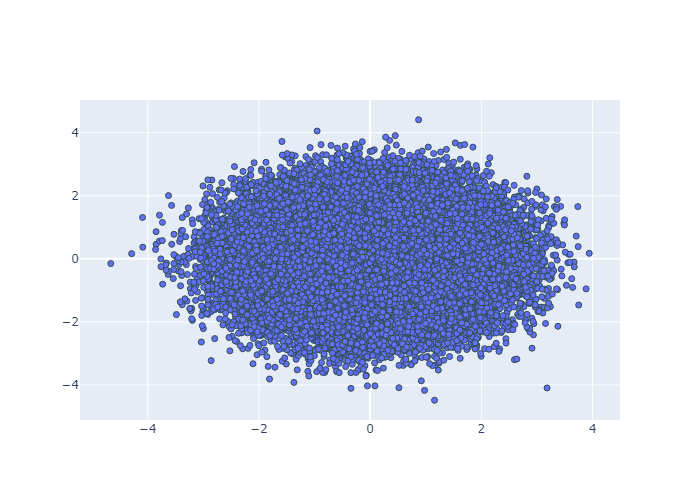

Execution time: 30.80833601951599 seconds
RAM memory % used: 96.0
RAM Used (GB): 16.323739648


In [36]:
# 2nd one

# finding: plot produced with go.Scatter() lags when scrolling over the notebook output.
# That`s why it is commented in the following. For trying out please uncomment.
# The measured computation time it small, however the actual rendering time

# get the start time
st = time.time()
#define figure
N = 100000

#Create figure
fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x = np.random.randn(N),
        y = np.random.randn(N),
        mode = 'markers',
        marker = dict(
            line = dict(
                width = 1,
                color = 'DarkSlateGrey')
        )
    )
)

fig.show(renderer='png')

# get the end time
et = time.time()
# get the execution time
elapsed_time = et - st
print('Execution time:', elapsed_time, 'seconds')
# Getting % usage of virtual_memory ( 3rd field)
print('RAM memory % used:', psutil.virtual_memory()[2])
# Getting usage of virtual_memory in GB ( 4th field)
print('RAM Used (GB):', psutil.virtual_memory()[3]/1000000000)

### Next, we plot our data_df

In [30]:
m = NeuralProphet()

In [31]:
train_df, test_df = m.split_df(data_df_10x, freq="H", valid_p=1.0 / 16)
train_df, cal_df = m.split_df(train_df, freq="H", valid_p=1.0 / 11)
train_df, val_df = m.split_df(train_df, freq="H", valid_p=1.0 / 10)

INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.999% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.999% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.999% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_

In [32]:
train_df.shape, val_df.shape, cal_df.shape, test_df.shape


((67194, 2), (7466, 2), (7465, 2), (5475, 2))

In [33]:
x_size = 16
y_size = 6
figsize = (x_size, y_size)

In [34]:
quantile_lo, quantile_hi = 0.05, 0.95
quantiles = [quantile_lo, quantile_hi]
n_lags = 3 * 24

In [35]:
m1 = NeuralProphet(
    quantiles=quantiles,
)

In [36]:
%%time
random_seed = 0

# Conconate train_df and val_df as full training set
set_random_seed(random_seed)
metrics1 = m1.fit(pd.concat([train_df, val_df]), freq="H")

INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.999% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 64
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 62


Finding best initial lr:   0%|          | 0/271 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

CPU times: total: 9min 32s
Wall time: 8min 50s


In [37]:
import pickle

# Save the variable to a file using pickle
with open('save_var/metrics1.pkl', 'wb') as f:
    pickle.dump(metrics1, f)
# with open('save_var/m1.pkl', 'wb') as f:
#     pickle.dump(m1, f)

OSError: [Errno 28] No space left on device

In [ ]:
# Load the variable from the file
# with open('save_var/metrics1.pkl', 'rb') as f:
#     metrics1 = pickle.load(f)
with open('save_var/m1.pkl', 'rb') as f:
    m1 = pickle.load(f)


In [ ]:
forecast1 = m1.predict(train_df)

**Set a cutoff and plot the forecast**

In [ ]:
cutoff = 10000
x_size = 10
y_size = 5
figsize = (x_size, y_size)
plotting_backend = "default"

In [ ]:
# get the start time
st = time.time()

fig1 = m1.highlight_nth_step_ahead_of_each_forecast(1).plot(
    forecast1[-cutoff:], figsize=figsize, plotting_backend='plotly'
).show()


print(pio.renderers.default)
# get the end time
et = time.time()
# get the execution time
elapsed_time = et - st
print('Execution time:', elapsed_time, 'seconds')
# Getting % usage of virtual_memory ( 3rd field)
print('RAM memory % used:', psutil.virtual_memory()[2])
# Getting usage of virtual_memory in GB ( 4th field)
print('RAM Used (GB):', psutil.virtual_memory()[3]/1000000000)

In [ ]:
fig2 = m1.plot(
    forecast1[-cutoff:], figsize=figsize, plotting_backend='matplotlib'
)